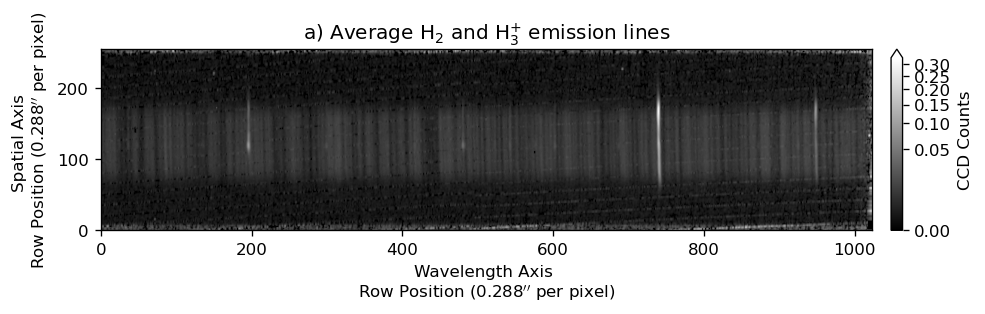

In [2]:
# import packages
from matplotlib import rcParams
rcParams['figure.dpi'] = 120
rcParams["savefig.dpi"] = 200
rcParams['figure.facecolor'] = 'w'

from astropy.io import fits
import numpy as np
import scipy
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import pandas as pd

from lmfit import Model, minimize, Parameters, fit_report
from lmfit.models import LinearModel

import os
import warnings
warnings.filterwarnings('ignore')


# path joining version for other paths
notebook_path = os.path.abspath('/Users/RuoyanWang/Documents/LEICESTER/h3p/code')
filepath = os.path.join(os.path.dirname(notebook_path), '02jun17/spec/')

# count number of fits files in folder
filesize = len([name for name in os.listdir(filepath) if os.path.isfile(os.path.join(filepath, name))])

# load fits data
nirspec_data = []
nirspec_utc_list = []

start_nirspec = 22 # fits index start, min >= 1, max <= n
end_nirspec = 112 # fits index end, min >= n, max <= 999

# order32
for i in range(filesize):
    n = i + start_nirspec
    if n>= start_nirspec and n < 10:
        hdu_data = fits.getdata(filepath + 'order32/new_frame/jun02s000' + '{}_order32.fits'.format(n), ext=0)
        hdu_header = fits.open(filepath + 'jun02s000' + '{}.fits'.format(n), ignore_missing_end=True)[0].header
        nirspec_data.append(hdu_data)
        nirspec_utc_list.append(hdu_header['UTC'])
    elif n>= 10 and n < 100:
        hdu_data = fits.getdata(filepath + 'order32/new_frame/jun02s00' + '{}_order32.fits'.format(n), ext=0)
        hdu_header = fits.open(filepath + 'jun02s00' + '{}.fits'.format(n), ignore_missing_end=True)[0].header
        nirspec_data.append(hdu_data)
        nirspec_utc_list.append(hdu_header['UTC'])
    elif n >= 100 and n < end_nirspec: # fits index ends at 111
        hdu_data = fits.getdata(filepath + 'order32/new_frame/jun02s0' + '{}_order32.fits'.format(n), ext=0)
        hdu_header = fits.open(filepath + 'jun02s0' + '{}.fits'.format(n), ignore_missing_end=True)[0].header
        nirspec_data.append(hdu_data)
        nirspec_utc_list.append(hdu_header['UTC'])
    elif n >= end_nirspec:
        break
nirspec_data_array = np.array(nirspec_data)
nirspec_utc = np.array(nirspec_utc_list)

# load waverange
waverange = fits.open(filepath + 'order32/' + 'waverange.fits', ignore_missing_end=True)[0].data

# load spectral resolution
R = 72803.45487481622

# obtain average flat field
average_flat_field = np.mean((nirspec_data_array[32-start_nirspec], 
                              nirspec_data_array[33-start_nirspec], 
                              nirspec_data_array[34-start_nirspec], 
                              nirspec_data_array[35-start_nirspec], 
                              nirspec_data_array[32-start_nirspec], 
                              nirspec_data_array[37-start_nirspec], 
                              nirspec_data_array[38-start_nirspec], 
                              nirspec_data_array[39-start_nirspec], 
                              nirspec_data_array[40-start_nirspec], 
                              nirspec_data_array[41-start_nirspec],), axis=0)


# obtain average flat lamp off
average_flat_lamp_off = np.mean((nirspec_data_array[22-start_nirspec], 
                                 nirspec_data_array[23-start_nirspec], 
                                 nirspec_data_array[24-start_nirspec],
                                 nirspec_data_array[25-start_nirspec], 
                                 nirspec_data_array[26-start_nirspec], 
                                 nirspec_data_array[27-start_nirspec], 
                                 nirspec_data_array[28-start_nirspec], 
                                 nirspec_data_array[29-start_nirspec], 
                                 nirspec_data_array[30-start_nirspec], 
                                 nirspec_data_array[31-start_nirspec],), axis=0)

# define normalization function
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# define guassian function, credit to pen and pants IDL's Gaussfit in Python
def gaussian_fit(x, a0, a1, a2, a3, a4, a5): 
    """
    x = data array
    a0 = height of guassian
    a1 = pixel position of Gaussian peak
    a2 = width of Gaussian
    a3 = constant term
    a4 = linear term
    a5 = quadratic term
    
    note: fwhm = a2 * np.sqrt(2 * np.log(2)) * 2
    """
    z = (x - a1) / a2
    y = a0 * np.exp(-z**2 / a2) + a3 + a4 * x + a5 * x**2
    return y

# convert observation time (UTC) to seconds 
def fits_header_utc_to_second(fn):
    # fn = frame_number
    if fn >= start_nirspec and fn < 10:
        hdu_header = fits.open(filepath + 'jun02s000' + '{}.fits'.format(fn), ignore_missing_end=True)[0].header
    elif fn >= 10 and fn < 100:
        hdu_header = fits.open(filepath + 'jun02s00' + '{}.fits'.format(fn), ignore_missing_end=True)[0].header
    elif fn >= 100 and fn < end_nirspec:
        hdu_header = fits.open(filepath + 'jun02s0' + '{}.fits'.format(fn), ignore_missing_end=True)[0].header
    elif fn >= end_nirspec:
        pass
    
    h = float(hdu_header['UTC'].split(':')[0])
    m = float(hdu_header['UTC'].split(':')[1])
    s = float(hdu_header['UTC'].split(':')[2])
    
    seconds = h * 3200 + m * 60 + s
    return seconds

# scale the sky frame using the equation on page 9 of Stallard_et_al_2019
def scale_sky_frame(fn_spec):
    """
    confirmed sky frames: 51, 59, 60, 72, 78, 79, 91, 103
    """
    if fn_spec > 51 and fn_spec < 59:
        fn_sky1 = 51 # frame number of sky1
        fn_sky2 = 59 # frame number of sky2
    elif fn_spec > 60 and fn_spec < 72:
        fn_sky1 = 60
        fn_sky2 = 72
    elif fn_spec > 72 and fn_spec < 78:
        fn_sky1 = 72
        fn_sky2 = 78
    elif fn_spec > 78 and fn_spec < 91:
        fn_sky1 = 79
        fn_sky2 = 91
    elif fn_spec > 91 and fn_spec < 103:
        fn_sky1 = 91
        fn_sky2 = 103

    sky1 = nirspec_data_array[fn_sky1-start_nirspec]
    sky2 = nirspec_data_array[fn_sky2-start_nirspec]

    t1 = fits_header_utc_to_second(fn_sky1) 
    t2 = fits_header_utc_to_second(fn_sky2)
    td = fits_header_utc_to_second(fn_spec)

    sky_final = sky1 * ((t2 - td) / (t2 - t1)) + sky2 * ((td - t1) / (t2 - t1))
    return sky_final

fn_spec = 61 #frame number of target spectra
sky_total = scale_sky_frame(fn_spec)

# remove sky background: (object - sky_frame)/(average_flat_field - average_flat_lamp_off)
target_spec = nirspec_data_array[fn_spec-start_nirspec]
sky_subtracted = (target_spec - sky_total) / (average_flat_field - average_flat_lamp_off)
sky_subtracted[sky_subtracted<0] = 0
pixel = np.linspace(0, np.size(sky_subtracted, 1), np.size(sky_subtracted, 1))


# show reduced fits
plt.figure(figsize=(10,2))
# plt.imshow(sky_subtracted**0.4, aspect='auto', extent=[waverange[0], waverange[-1], 0, 165], cmap='gist_gray')
plt.imshow(sky_subtracted, aspect='auto', cmap='gist_gray', norm=colors.PowerNorm(gamma=0.4))
# plt.xlabel(r'Wavelength ($\mu$m)')
plt.xlabel('Wavelength Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
plt.ylabel('Spatial Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
plt.ticklabel_format(useOffset=False)
plt.title('a) Average H$_2$ and H$_3^{+}$ emission lines')
plt.gca().invert_yaxis()
# plt.colorbar(extend='max', aspect=15, pad=0.02, label=r'Intensity (Wm$^{-2}$sr$^{-1}$)')
plt.colorbar(extend='max', aspect=15, pad=0.02, label='CCD Counts')
#plt.savefig('spec_img', bbox_inches='tight')

In [3]:
sky_subtracted

array([[0.00419798, 0.0060197 , 0.00311607, ..., 0.01173721, 0.01204505,
        0.0105828 ],
       [0.0079922 , 0.00560783, 0.00221227, ..., 0.        , 0.        ,
        0.        ],
       [0.00922105, 0.00787319, 0.00585754, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02684725, 0.02781511, 0.02827307, ..., 0.06142578, 0.03325083,
        0.        ],
       [0.00934626, 0.00963575, 0.00982236, ..., 0.02799666, 0.00912612,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.01277422]], dtype=float32)

In [3]:
waveaxis = np.linspace(0, 1023, 1024)

x = waveaxis
y = waverange

mod = LinearModel()

pars = mod.guess(y, x=x)
out = mod.fit(y, pars, x=x)

print(out.fit_report(min_correl=0.25))

slope = out.params['slope'].value
intercept = out.params['intercept'].value

# sky1_spat_all = np.linspace(0, len(sky1_a1), len(sky1_a1))+225+lower_skyline
wave_best_fit = slope*waveaxis + intercept

# plt.figure()
# plt.plot(waveaxis, waverange,'k', label = 'original')
# plt.plot(waveaxis, wave_best_fit, 'r', label = 'best fit')
# plt.xlabel('spatial axis')
# plt.ylabel('a1')
# plt.ticklabel_format(useOffset=False)
# plt.legend()

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 3
    # data points      = 1024
    # variables        = 2
    chi-square         = 4.8537e-12
    reduced chi-square = 4.7492e-15
    Akaike info crit   = -33770.3461
    Bayesian info crit = -33760.4832
[[Variables]]
    slope:      3.3040e-05 +/- 7.2853e-12 (0.00%) (init = 3.304e-05)
    intercept:  2.38226635 +/- 4.3040e-09 (0.00%) (init = 2.382266)
[[Correlations]] (unreported correlations are < 0.250)
    C(slope, intercept) = -0.866


In [4]:
# confirm start and end frame number
fn_start = 60
fn_end = 104
sky_frame = (51, 59, 60, 72, 78, 79, 91, 103)

# create empty list to collect result
background_scan = []


print('BLANK LOOP START')
print()
# scan selected range of frames
for fn in range(fn_start, fn_end):
    # check if selected frame is a sky frame
    if fn in sky_frame:
#         print('Frame Number = ' + str(fn) + '(Sky Frame)')
#         print()
        continue
    # perform sky subtraction
    skyfinal = scale_sky_frame(fn)
    sky_subtract = (nirspec_data_array[fn-start_nirspec] - skyfinal) / (average_flat_field - average_flat_lamp_off)
    
    # select waverange for gaussian fit
    a = np.delete(sky_subtract, np.s_[1000:], 1)
    b = np.delete(a, np.s_[:0], 1)
    b[b<0]=0
    
    
    # partition frame numbers to account for change in spatial axis       
    if fn >= fn_start and fn < fn_end:
#         print('Frame Number = ' + str(fn))
        
        # define range on spatial axis to fit
        upper_h2 = 246
        lower_h2 = 10

#         blank = np.zeros(np.size(b,0))
        blank = np.zeros(300)      
            
        # fit gaussian to selected range of spatial axis of a frame
        for i in range(lower_h2, upper_h2):               
            # different initial guess for different spatial range
            if i >= lower_h2 and i < upper_h2:
                blank[i] = np.median(b[i])
                
#     print()
    
    # Collect fitting parameters of each frame number   
    background_scan.append(blank)
    
    
print('DONE')

BLANK LOOP START

DONE


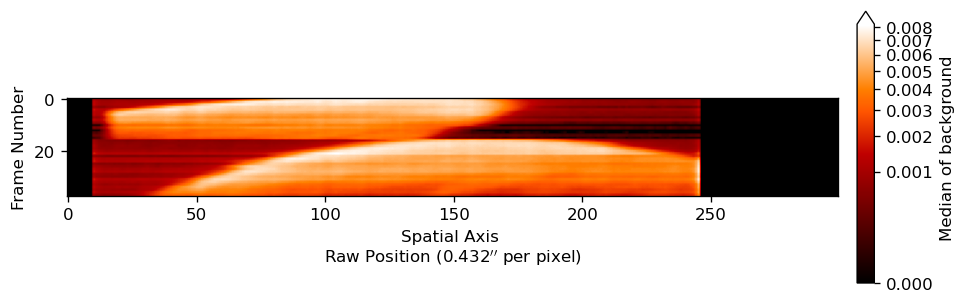

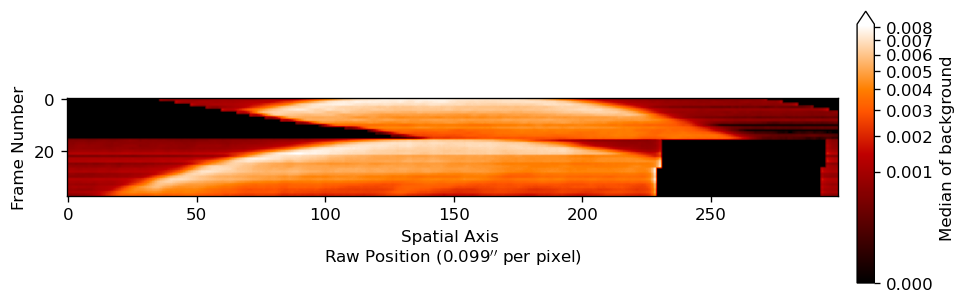

In [63]:
backgr = np.vstack(background_scan)
# backgr = np.delete(backgr, np.s_[132:], 1)
# backgr = np.delete(backgr, np.s_[:7], 1)

backgr1 = np.roll(backgr[:6], 26, axis=1)
backgr2 = np.roll(backgr[6:11], 25, axis=1)
backgr3 = np.roll(backgr[11:16], 32, axis=1)
backgr4 = np.roll(backgr[16:27], -15, axis=1)
backgr5 = np.roll(backgr[27:], -17, axis=1)
# backgr4 = scipy.ndimage.shift(backgr4, -15.5, order=5)

backgr_shifted = np.vstack((backgr1,backgr2,backgr3, backgr4, backgr5))

# backgr_shifted = backgr

for i in range(16):
    backgr_shifted[i,:] = scipy.ndimage.shift(backgr_shifted[i,:], i*6, order=3)

plt.figure(figsize=(10,3))
plt.imshow(backgr, cmap='gist_heat', norm=colors.PowerNorm(gamma=0.4))
plt.xlabel('Spatial Axis \nRaw Position (0.432$^{\prime\prime}$ per pixel)')
plt.ylabel('Frame Number')
# plt.title(r'a) H$_2$($\lambda$$\approx$' + str(round(waverange[96], 4)) + '$\mu$m)', loc='left')
plt.colorbar(extend='max', aspect=15, pad=0.02, label='Median of background')

plt.figure(figsize=(10,3))
plt.imshow(backgr_shifted, cmap='gist_heat', norm=colors.PowerNorm(gamma=0.4))
plt.xlabel('Spatial Axis \nRaw Position (0.099$^{\prime\prime}$ per pixel)')
plt.ylabel('Frame Number')
# plt.title(r'a) H$_2$($\lambda$$\approx$' + str(round(waverange[96], 4)) + '$\mu$m)', loc='left')
plt.colorbar(extend='max', aspect=15, pad=0.02, label='Median of background')

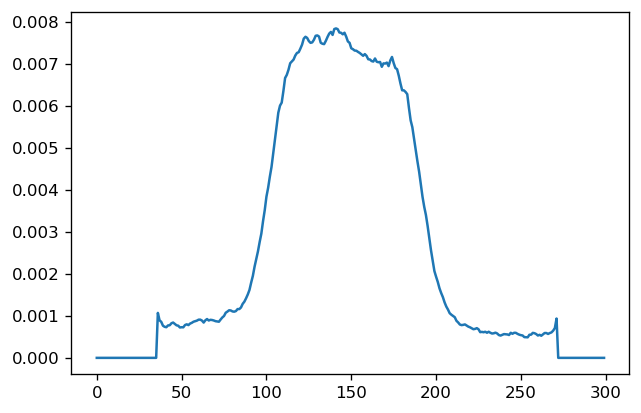

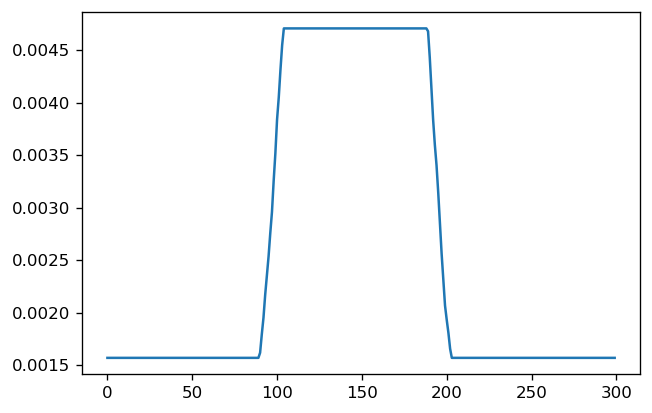

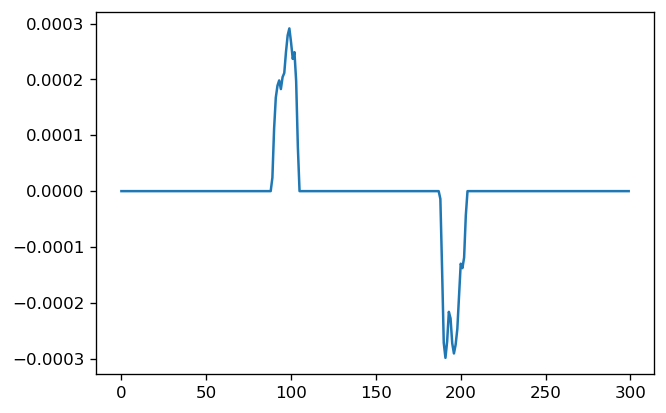

In [64]:
# backgr_shifted = np.vstack(background_scan)

limbs = backgr_shifted[0,:]
plt.figure()
plt.plot(limbs)

limbs[limbs<np.amax(limbs)*0.2] = np.amax(limbs)*0.2
limbs[limbs>np.amax(limbs)*0.6] = np.amax(limbs)*0.6

plt.figure()
plt.plot(limbs)
plt.figure()
plt.plot(np.gradient(limbs))

In [65]:
peak = np.linspace(0, 299, 300)[np.where(np.gradient(limbs)==np.max(np.gradient(limbs)))]
trough = np.linspace(0, 299, 300)[np.where(np.gradient(limbs)==np.min(np.gradient(limbs)))]

peak, trough

(array([99.]), array([191.]))

In [66]:
(float(peak) + float(trough))/2

145.0

In [ ]:
gmodel = Model(gaussian_fit)

gparams = gmodel.make_params()
gparams.add('a0', value=0.16)
gparams.add('a1', value=33)
gparams.add('a2', value=3)
gparams.add('a3', value=0)
gparams.add('a4', value=0)
gparams.add('a5', value=0)

gresult = gmodel.fit(b[70], gparams, x=np.linspace(0, 64, 65))

print(fit_report(gresult, min_correl=0.25))

plt.figure()
plt.plot(np.linspace(0, 64, 65), b[70], 'k.', label='data')
plt.plot(np.linspace(0, 64, 65), gresult.best_fit, 'r-', lw=1, label='best fit')
plt.xlim(10,50)
plt.xlabel('Wavelength Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
plt.ylabel('CCD Counts')
plt.legend()

In [ ]:
fig = plt.figure(figsize=(12,5), tight_layout=True)

fig.add_subplot(121)
plt.imshow(b, aspect='equal', cmap='afmhot')
plt.axhline(y=70, c='white', ls='--', lw=0.6)
plt.xlabel('Wavelength Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
plt.ylabel('Spatial Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
plt.title('a)', loc='left')
plt.gca().invert_yaxis()
plt.colorbar(extend='max', label='CCD Counts')

fig.add_subplot(122)
plt.plot([34, 34], [0.04, 0.16], color='k', linestyle='--', dashes=(5,10), lw=1)
plt.plot([20, 34], [0.16, 0.16], color='k', linestyle='--', dashes=(5,10), lw=1)
# plt.plot([20, 20], [0.04, 0.16], color='b', linestyle='-', lw=1)
plt.arrow(20, 0.04, 0, 0.12, head_width=0.5, head_length=0.004, fc='b', ec='b', length_includes_head=True)
plt.arrow(0, 0.04, 34, 0, head_width=0.004, head_length=0.5, width=0.0001, fc='b', ec='b', length_includes_head=True)
plt.arrow(32.65, 0.1, 2.6, 0, head_width=0.004, head_length=0.3, width=0.00005, fc='b', ec='b', length_includes_head=True)
plt.arrow(35.35, 0.1, -2.65, 0, head_width=0.004, head_length=0.3, width=0.00005, fc='b', ec='b', length_includes_head=True)
plt.text(18, 0.1, '$\mathrm{A_0}$', color='b')
plt.text(31, 0.03, '$\mathrm{A_1}$', color='b')
plt.text(36, 0.1, '$\mathrm{FWHM}$', color='b')
plt.plot(np.linspace(0, 64, 65), b[70], 'k.', label='data')
plt.plot(np.linspace(0, 64, 65), gresult.best_fit, 'r-', lw=1.5, label='best fit')
plt.xlim(10,50)
plt.xlabel('Wavelength Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
plt.ylabel('CCD Counts')
plt.title('b)', loc='left')
plt.legend()

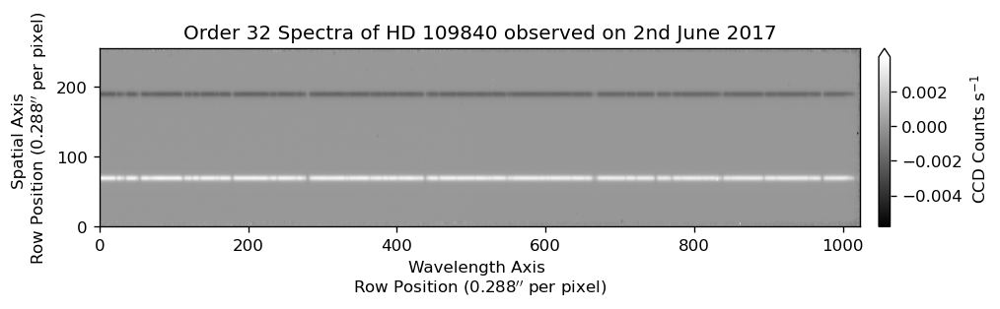

In [32]:
modeA = nirspec_data_array[43-start_nirspec] +\
        nirspec_data_array[46-start_nirspec] +\
        nirspec_data_array[47-start_nirspec] +\
        nirspec_data_array[50-start_nirspec]
modeB = nirspec_data_array[44-start_nirspec] +\
        nirspec_data_array[45-start_nirspec] +\
        nirspec_data_array[48-start_nirspec] +\
        nirspec_data_array[49-start_nirspec]                              
star_exp_time = 20

modeAB = ((modeA - modeB)/4)/(average_flat_field - average_flat_lamp_off)/star_exp_time

plt.figure(figsize=(10,2))
plt.imshow(modeAB, aspect='auto', cmap='gist_gray')
plt.title('Order 32 Spectra of HD 109840 observed on 2nd June 2017')
plt.xlabel('Wavelength Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
plt.ylabel('Spatial Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
# plt.ticklabel_format(useOffset=False)
plt.gca().invert_yaxis()
plt.colorbar(extend='max', aspect=15, pad=0.02, label='CCD Counts s$^{-1}$')
# plt.colorbar(extend='max', aspect=15, pad=0.02, label='CCD Counts')

In [33]:
modeAB.shape

(255, 1024)

In [34]:
top = np.linspace(0, np.size(modeAB,0)-1, np.size(modeAB,0))[np.max(modeAB.T[200]) == modeAB.T[200]]
bot = np.linspace(0, np.size(modeAB,0)-1, np.size(modeAB,0))[np.min(modeAB.T[200]) == modeAB.T[200]]

(bot-top)[0]

120.0

In [35]:
bot,top

(array([188.]), array([68.]))

In [22]:
12/121

0.09917355371900827

In [19]:
bott, topp

(array([188.]), array([67.]))

In [226]:
166*0.65

107.9

In [235]:
modeAB.shape

(166, 1024)

In [4]:
120/78*166

255.3846153846154

In [232]:
166/0.65

255.3846153846154

In [137]:
top = np.linspace(0, np.size(modeAB,0)-1, np.size(modeAB,0))[np.max(modeAB.T[200]) == modeAB.T[200]]
bot = np.linspace(0, np.size(modeAB,0)-1, np.size(modeAB,0))[np.min(modeAB.T[200]) == modeAB.T[200]]

(bot-top)[0]

78.0

In [138]:
12/(bot-top)[0]

0.15384615384615385

In [223]:
0.1/(12/(bot-top)[0])

0.65

In [125]:
np.sqrt(((189.46485-189.46701)*3600)**2 + ((4.28987-4.28732)*3600)**2)

12.030734640850644

In [36]:
flux_model = Model(gaussian_fit)

flux_params = flux_model.make_params()
flux_params.add('a0', value=0.005, min=0, max=0.05)
flux_params.add('a1', value=68, min=65, max=71)
flux_params.add('a2', value=2, min=0.5, max=5)
flux_params.add('a3', value=0)
flux_params.add('a4', value=0)
flux_params.add('a5', value=0)

lower_flux = 0
upper_flux = 1024

spat_axis = np.linspace(0,254,255)

HD109840_a0 = np.zeros(np.size(modeAB,1))
HD109840_a2 = np.zeros(np.size(modeAB,1))

for i in range(lower_flux, upper_flux):
#     if i == 492:
#         continue
    try:
        flux_fit_result = flux_model.fit(modeAB.T[i], flux_params, x=spat_axis)
    except ValueError:
        print('ValueError occured at i=' + str(i))
#     plt.figure()
#     plt.title('i='+str(i))
#     plt.plot(spat_axis, modeAB.T[i])
#     plt.plot(spat_axis, flux_fit_result.best_fit, 'r-', label='best fit')
    
    HD109840_a0[i] = flux_fit_result.params['a0'].value
    HD109840_a2[i] = flux_fit_result.params['a2'].value
    
# HD109840_a0[HD109840_a0<0.05] = 0.1
# HD109840_a2[HD109840_a2<0] = 0
HD109840_a0[HD109840_a0<(np.mean(HD109840_a0)-4*np.std(HD109840_a0))] = np.mean(HD109840_a0)
HD109840_a2[HD109840_a2<(np.mean(HD109840_a2)-4*np.std(HD109840_a2))] = np.mean(HD109840_a2)

Text(0, 0.5, 'Flux ($\\mathrm{Wm^{-2} \\mu m^{-1} count^{-1} s}$)')

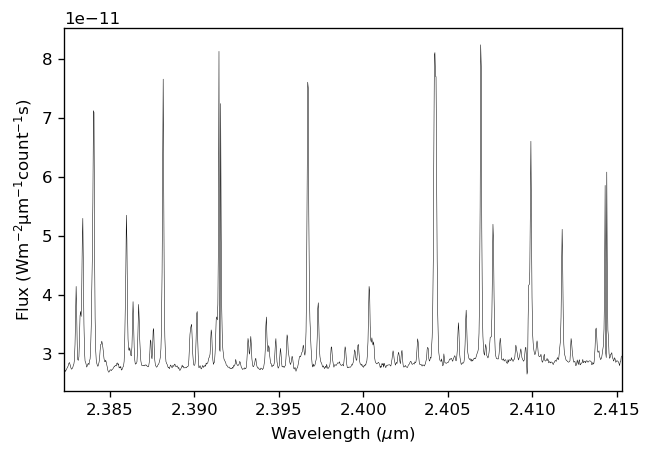

In [37]:
lambda_aw = 2.2 # mu m
hc_kb = 14388 # mu m K
T = 10000 # K

F_alpha_lyrae = 4.07e-10
m_lambda = 6.787 # Kmag HD 109840
F_a0 = F_alpha_lyrae * 10**(-0.4*m_lambda)
F_bb = F_a0 * ((lambda_aw/waverange)**5) * ((np.exp(hc_kb/(lambda_aw*T)) - 1)/(np.exp(hc_kb/(waverange*T)) - 1))

HD109840_fwhm = HD109840_a2*(np.sqrt(2*np.log(2))*2)
F_obs = HD109840_a0 * HD109840_fwhm

Fc = F_bb/F_obs

# HD131885_fwhm = HD131885_a2*(np.sqrt(2*np.log(2))*2)
# F_obs2 = HD131885_a0 * HD131885_fwhm

# Fc2 = F_bb/(F_obs2)

width = np.size(sky_subtracted, axis=0)
length = np.size(sky_subtracted, axis=1)

slit_area = 0.1*width * 3.304e-5*length

Fjc = sky_subtracted * Fc * slit_area
# plt.figure(figsize=(10,2))
# plt.imshow(Fjc**0.4, aspect='auto', extent=[waverange[0], waverange[-1], 140, 0], cmap='gist_gray')
# plt.plot(waverange[:995], Fc2[:995], 'r-', label='Model')
# plt.plot(waverange[:1000], Fc[:1000], 'b-', label='Model')
# plt.legend()
# plt.xlabel('Wavelength ($\mu$m)')
# plt.ylabel('Spatial Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
# plt.gca().invert_yaxis()
# plt.colorbar(extend='max', aspect=15, pad=0.02, label=r'Intensity (Wm$^{-2}$sr$^{-1}$)')
# plt.colorbar(extend='max', aspect=15, pad=0.02, label='Flux (Wm$^{-2}$sr$^{-1}$$\mu$m$^{-1}$)')

plt.figure()
# plt.plot(waverange[:1000], F_bb[:1000], 'k-', lw=0.3)
# plt.plot(waverange[:1000], F_obs[:1000], 'k-', lw=0.3)
plt.plot(waverange[:1000], Fc[:1000], 'k-', lw=0.3)
plt.xlim(waverange[0], waverange[1000])
# plt.plot(waverange, Fjc[60]-np.median(Fjc[60]), label='median subtracted')
plt.xlabel('Wavelength ($\mu$m)')
# plt.ylabel('Flux (W m$^{-2}$ $\mu$m$^{-1}$)')
# plt.ylabel('CCD Counts s$^{-1}$')
# plt.ylabel('CCD Counts')
# plt.ylabel('Flux (W sr$^{-1}$ m$^{-2}$ $\mu$m$^{-1}$)')
plt.ylabel('Flux ($\mathrm{Wm^{-2} \mu m^{-1} count^{-1} s}$)')
# plt.legend()

In [ ]:
fig = plt.figure(figsize=(12,10), tight_layout=True)
# ax = fig.add_subplot(111, frameon=True)
# ax.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
fig.add_subplot(311)
plt.imshow(target_spec, aspect='auto', cmap='gist_gray')
plt.title('a)', loc='left')
plt.gca().invert_yaxis()
plt.colorbar(extend='max', aspect=15, pad=0.02, label='CCD Counts')
plt.title('Sky Subtraction Process', fontsize=18)
fig.add_subplot(312)
plt.imshow(sky_total, aspect='auto', cmap='gist_gray')
plt.title('b)', loc='left')
plt.colorbar(extend='max', aspect=15, pad=0.02, label='CCD Counts')
plt.ylabel('Spatial Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)', fontsize=16)
plt.gca().invert_yaxis()
fig.add_subplot(313)
plt.imshow(target_spec-sky_total, aspect='auto', cmap='gist_gray')
plt.title('c)', loc='left')
plt.colorbar(extend='max', aspect=15, pad=0.02, label='CCD Counts')
plt.xlabel('Wavelength Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)', fontsize=16)
plt.gca().invert_yaxis()
# ax.set_xlabel('Wavelength Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')
# ax.set_ylabel('Spatial Axis \nRow Position (0.288$^{\prime\prime}$ per pixel)')

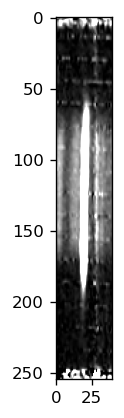

In [57]:
a = np.delete(Fjc, np.s_[760:], 1)
b = np.delete(a, np.s_[:720], 1)

plt.figure()
plt.imshow(b, aspect='equal', cmap='gist_gray', vmax=np.max(b)/20)

In [52]:
np.max(b)

8.422472471331987e-12

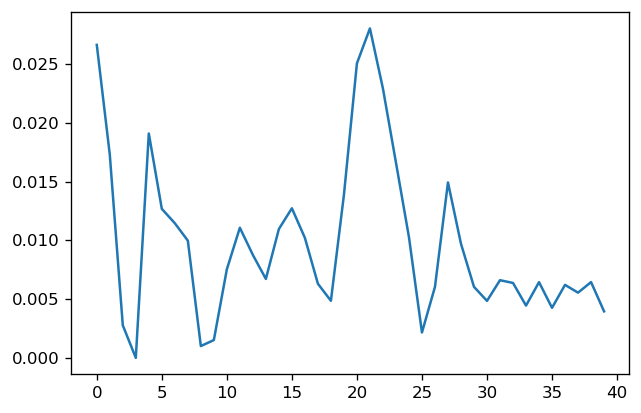

In [29]:
plt.plot(b[60]*1e11)

H2 LOOP START
Frame Number = 102
Frame Number = 103(Sky Frame)
DONE


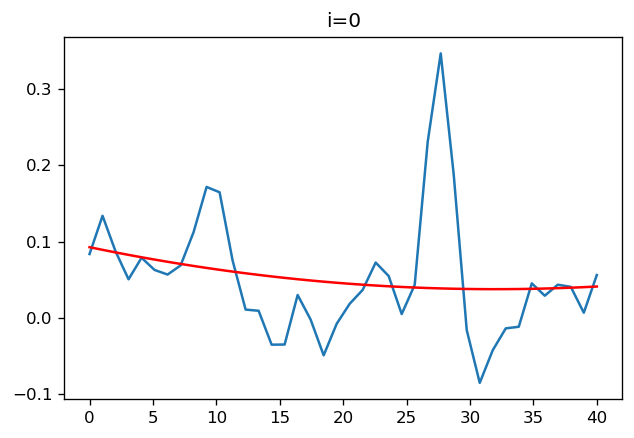

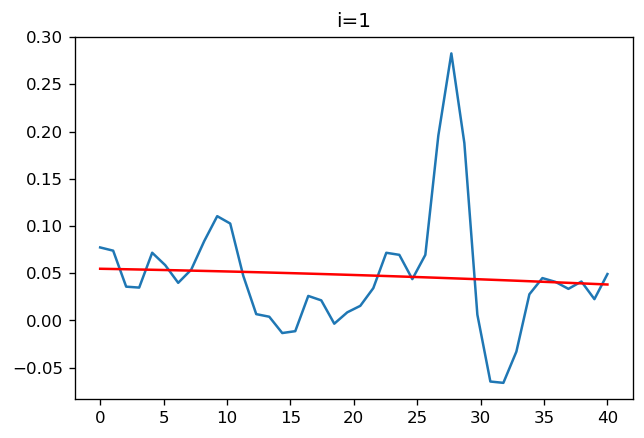

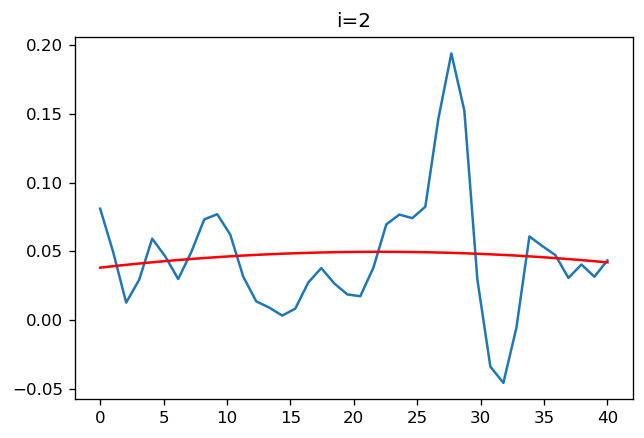

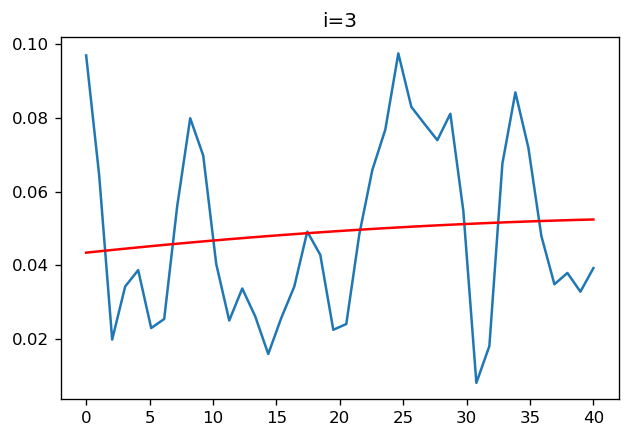

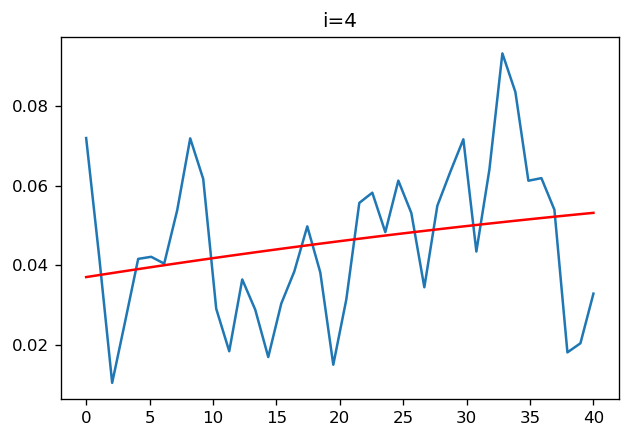

...

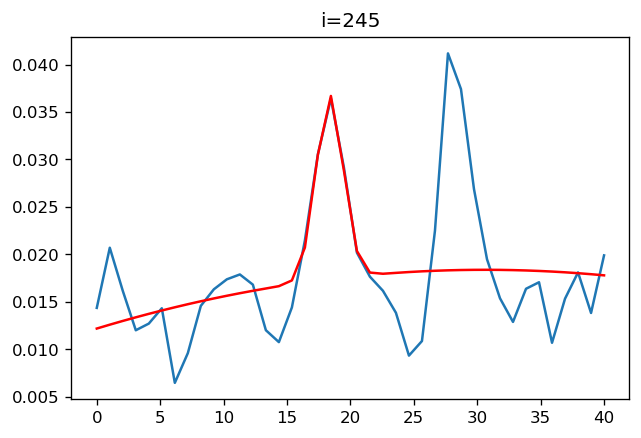

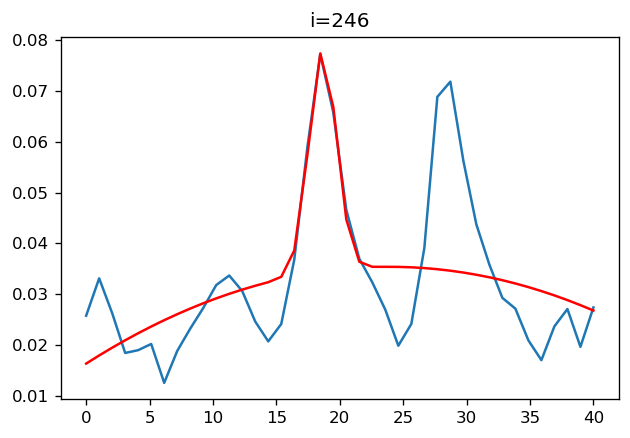

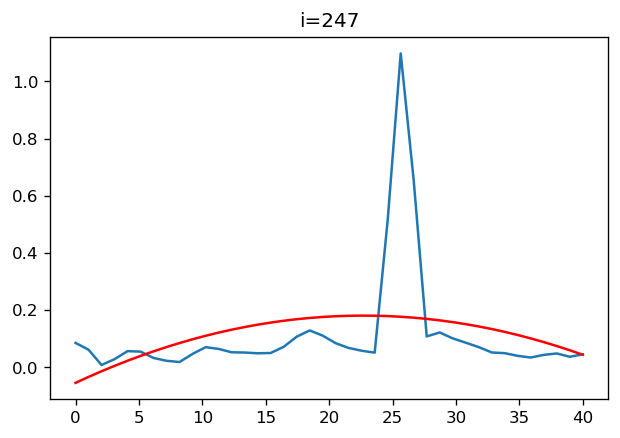

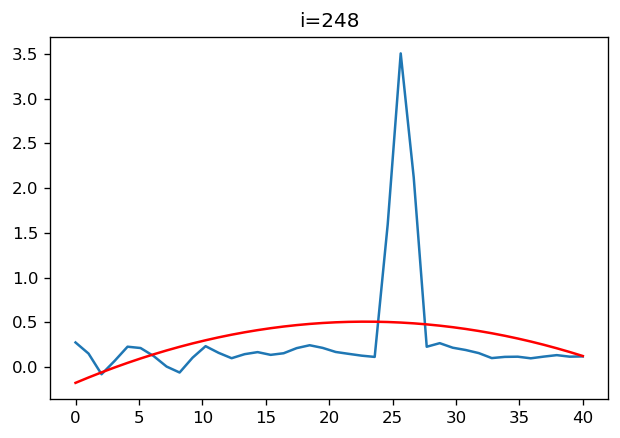

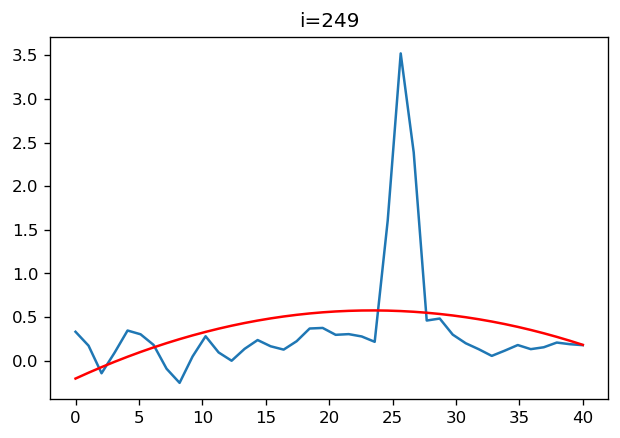

In [50]:
# define normalization function
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# define guassian function, credit to pen and pants IDL's Gaussfit in Python
def gaussian_fit(x, a0, a1, a2, a3, a4, a5): 
    """
    x = data array
    a0 = height of guassian
    a1 = pixel position of Gaussian peak
    a2 = width of Gaussian
    a3 = constant term
    a4 = linear term
    a5 = quadratic term
    
    note: fwhm = a2 * np.sqrt(2 * np.log(2)) * 2
    """
    z = (x - a1) / a2
    y = a0 * np.exp(-z**2 / a2) + a3 + a4 * x + a5 * x**2
    return y

# confirm start and end frame number
fn_start = 102
fn_end = 104
sky_frame = (51, 59, 60, 72, 78, 79, 91, 103)

# create empty list to collect result
h2_a0_map = []
h2_a1_map = []
h2_a2_map = []
# utc = []


print('H2 LOOP START')
# scan selected range of frames
for fn in range(fn_start, fn_end):
    # check if selected frame is a sky frame
    if fn in sky_frame:
        print('Frame Number = ' + str(fn) + '(Sky Frame)')
        continue
    # perform sky subtraction
    skyfinal = scale_sky_frame(fn)
    sky_subtract = (nirspec_data_array[fn-start_nirspec] - skyfinal) / (average_flat_field - average_flat_lamp_off)
    fjc = sky_subtract * Fc * slit_area
#     utc.append(nirspec_utc[fn-start_nirspec])
    
    # select waverange for gaussian fit
#     a = np.delete(sky_subtract, np.s_[120:], 1)
    a = np.delete(fjc, np.s_[760:], 1)
    b = np.delete(a, np.s_[:720], 1)
    
    # define new wavlength axis
#     waveaxis = waverange[80:120]*10**5
    pixel = np.linspace(0, np.size(b, 1), np.size(b, 1))
    
    # partition frame numbers to account for change in spatial axis       
    if fn >= fn_start and fn < fn_end:
        print('Frame Number = ' + str(fn))
        
        # define range on spatial axis to fit
        upper_h2 = 100
        lower_h2 = 90

        h2_a0 = np.zeros(300)
        h2_a1 = np.zeros(300)
        h2_a2 = np.zeros(300)
    
            
        # fit gaussian to selected range of spatial axis of a frame
        for i in range(lower_h2, upper_h2):               
            # different initial guess for different spatial range
            if i >= lower_h2 and i < upper_h2:
            # create lmfit model with defined gaussian
                h2_model = Model(gaussian_fit)

                # create parameters and add initial guess
                h2_params = h2_model.make_params()
                h2_params.add('a0', value=0.1, min=0, max=2)
                h2_params.add('a1', value=19, min=16, max=22)
                h2_params.add('a2', value=1, min=0, max=3)
                h2_params.add('a3', value=0)
                h2_params.add('a4', value=0)
                h2_params.add('a5', value=0)
                
                # perform gaussian fit and test errors
                try:
                    h2_fit_result = h2_model.fit((b[i])*1e11, h2_params, x=pixel)
                except ValueError:
                    print('ValueError occured at i=' + str(i))                                        
                plt.figure()
                plt.title('i='+str(i))
                plt.plot(pixel, b[i]*10**11)
                plt.plot(pixel, h2_fit_result.best_fit, 'r-', label='best fit')
                
                # collect fitting parameters
                h2_a0[i] = h2_fit_result.params['a0'].value
                h2_a1[i] = h2_fit_result.params['a1'].value
                h2_a2[i] = h2_fit_result.params['a2'].value
                
    
    # Collect fitting parameters of each frame number   
    h2_a0_map.append(h2_a0)
    h2_a1_map.append(h2_a1)
    h2_a2_map.append(h2_a2)
    
    
print('DONE')

In [38]:
# define normalization function
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# define guassian function, credit to pen and pants IDL's Gaussfit in Python
def gaussian_fit(x, a0, a1, a2, a3, a4, a5): 
    """
    x = data array
    a0 = height of guassian
    a1 = pixel position of Gaussian peak
    a2 = width of Gaussian
    a3 = constant term
    a4 = linear term
    a5 = quadratic term
    
    note: fwhm = a2 * np.sqrt(2 * np.log(2)) * 2
    """
    z = (x - a1) / a2
    y = a0 * np.exp(-z**2 / a2) + a3 + a4 * x + a5 * x**2
    return y

# confirm start and end frame number
fn_start = 60
fn_end = 104
sky_frame = (51, 59, 60, 72, 78, 79, 91, 103)

# create empty list to collect result
h2_a0_map = []
h2_a1_map = []
h2_a2_map = []
# utc = []


print('H2 LOOP START')
# scan selected range of frames
for fn in range(fn_start, fn_end):
    # check if selected frame is a sky frame
    if fn in sky_frame:
        print('Frame Number = ' + str(fn) + '(Sky Frame)')
        continue
    # perform sky subtraction
    skyfinal = scale_sky_frame(fn)
    sky_subtract = (nirspec_data_array[fn-start_nirspec] - skyfinal) / (average_flat_field - average_flat_lamp_off)
    fjc = sky_subtract * Fc * slit_area
#     utc.append(nirspec_utc[fn-start_nirspec])
    
    # select waverange for gaussian fit
#     a = np.delete(sky_subtract, np.s_[120:], 1)
    a = np.delete(fjc, np.s_[760:], 1)
    b = np.delete(a, np.s_[:720], 1)
    
    # define new wavlength axis
#     waveaxis = waverange[80:120]*10**5
    pixel = np.linspace(0, np.size(b, 1), np.size(b, 1))
    
    # partition frame numbers to account for change in spatial axis       
    if fn >= fn_start and fn < fn_end:
        print('Frame Number = ' + str(fn))
        
        # define range on spatial axis to fit
        upper_h2 = 250
        lower_h2 = 0

        h2_a0 = np.zeros(300)
        h2_a1 = np.zeros(300)
        h2_a2 = np.zeros(300)
    
            
        # fit gaussian to selected range of spatial axis of a frame
        for i in range(lower_h2, upper_h2):               
            # different initial guess for different spatial range
            if i >= lower_h2 and i < upper_h2:
            # create lmfit model with defined gaussian
                h2_model = Model(gaussian_fit)

                # create parameters and add initial guess
                h2_params = h2_model.make_params()
                h2_params.add('a0', value=0.1, min=0, max=2)
                h2_params.add('a1', value=19, min=16, max=22)
                h2_params.add('a2', value=1, min=0, max=3)
                h2_params.add('a3', value=0)
                h2_params.add('a4', value=0)
                h2_params.add('a5', value=0)
                
                # perform gaussian fit and test errors
                try:
                    h2_fit_result = h2_model.fit((b[i])*1e11, h2_params, x=pixel)
                except ValueError:
                    print('ValueError occured at i=' + str(i))
#                 plt.figure()
#                 plt.title('i='+str(i))
#                 plt.plot(pixel, b[i]*10**5)
#                 plt.plot(pixel, h2_fit_result.best_fit, 'r-', label='best fit')
                
                # collect fitting parameters
                h2_a0[i] = h2_fit_result.params['a0'].value
                h2_a1[i] = h2_fit_result.params['a1'].value
                h2_a2[i] = h2_fit_result.params['a2'].value
                
    
    # Collect fitting parameters of each frame number   
    h2_a0_map.append(h2_a0)
    h2_a1_map.append(h2_a1)
    h2_a2_map.append(h2_a2)
    
    
print('DONE')

H2 LOOP START
Frame Number = 60(Sky Frame)
Frame Number = 61
Frame Number = 62
Frame Number = 63
Frame Number = 64
Frame Number = 65
Frame Number = 66
Frame Number = 67
Frame Number = 68
Frame Number = 69
Frame Number = 70
Frame Number = 71
Frame Number = 72(Sky Frame)
Frame Number = 73
Frame Number = 74
Frame Number = 75
Frame Number = 76
Frame Number = 77
Frame Number = 78(Sky Frame)
Frame Number = 79(Sky Frame)
Frame Number = 80
Frame Number = 81
Frame Number = 82
Frame Number = 83
Frame Number = 84
Frame Number = 85
Frame Number = 86
Frame Number = 87
Frame Number = 88
Frame Number = 89
Frame Number = 90
Frame Number = 91(Sky Frame)
Frame Number = 92
Frame Number = 93
Frame Number = 94
Frame Number = 95
Frame Number = 96
Frame Number = 97
Frame Number = 98
Frame Number = 99
Frame Number = 100
Frame Number = 101
Frame Number = 102
Frame Number = 103(Sky Frame)
DONE


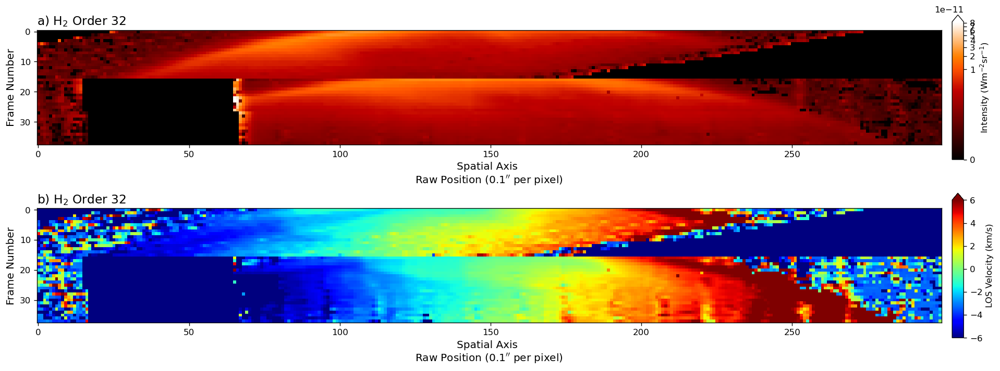

In [41]:
h2a0 = np.vstack((h2_a0_map))
h2a1 = np.vstack((h2_a1_map)) + 720
h2a2 = np.vstack((h2_a2_map))

h2_fwhm = h2a2*(np.sqrt(2*np.log(2))*2)
h2_int = h2a0*h2_fwhm/1e11

h2_wl = h2a1
h2_los = h2_wl/R*3e5

h2_int1 = np.roll(h2_int[:6], 26, axis=1)
h2_int2 = np.roll(h2_int[6:11], 25, axis=1)
h2_int3 = np.roll(h2_int[11:16], 32, axis=1)
h2_int4 = np.roll(h2_int[16:27], -15, axis=1)
h2_int5 = np.roll(h2_int[27:], -17, axis=1)
h2_int_shifted = np.vstack((h2_int1, h2_int2, h2_int3, h2_int4, h2_int5))

for i in range(16):
    h2_int_shifted[i,:] = scipy.ndimage.shift(h2_int_shifted[i,:], i*6, order=3)
    
h2_los1 = np.roll(h2_los[:6], 26, axis=1)
h2_los2 = np.roll(h2_los[6:11], 25, axis=1)
h2_los3 = np.roll(h2_los[11:16], 32, axis=1)
h2_los4 = np.roll(h2_los[16:27], -15, axis=1)
h2_los5 = np.roll(h2_los[27:], -17, axis=1)
h2_los_shifted = np.vstack((h2_los1, h2_los2, h2_los3, h2_los4, h2_los5))

for i in range(16):
    h2_los_shifted[i,:] = scipy.ndimage.shift(h2_los_shifted[i,:], i*6, order=3)
    
    
h2_int_shifted = np.flip(h2_int_shifted, axis=1)
h2_int_shifted[h2_int_shifted<0]=0
h2_los_shifted = np.flip(h2_los_shifted, axis=1)

h2_los_rel = h2_los_shifted-np.median(h2_los_shifted, axis=0)[149]
h2_los_rel[h2_los_rel>6] = 6
h2_los_rel[h2_los_rel<-6] = -6

fig = plt.figure(figsize=(18,6), tight_layout=True)

# plt.figure(figsize=(15,2))
fig.add_subplot(211)
plt.imshow(h2_int_shifted, cmap='gist_heat', norm=colors.PowerNorm(gamma=0.2))
plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
plt.ylabel('Frame Number', fontsize=12)
# plt.title(r'a) H$_2$($\lambda$$\approx$' + str(round(waverange[96], 4)) + '$\mu$m)', loc='left')
plt.title('a) H$_2$ Order 32', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=12, pad=0.01, label='Intensity (Wm$^{-2}$sr$^{-1}$)')

fig.add_subplot(212)
plt.imshow(h2_los_rel, cmap='jet')
plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
plt.ylabel('Frame Number', fontsize=12)
# plt.title(r'b) H$_2$($\lambda$$\approx$' + str(round(waverange[96], 4)) + '$\mu$m)', loc='left')
plt.title('b) H$_2$ Order 32', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=12, pad=0.01, label='LOS Velocity (km/s)')

In [44]:
# define normalization function
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# define guassian function, credit to pen and pants IDL's Gaussfit in Python
def gaussian_fit(x, a0, a1, a2, a3, a4, a5): 
    """
    x = data array
    a0 = height of guassian
    a1 = pixel position of Gaussian peak
    a2 = width of Gaussian
    a3 = constant term
    a4 = linear term
    a5 = quadratic term
    
    note: fwhm = a2 * np.sqrt(2 * np.log(2)) * 2
    """
    z = (x - a1) / a2
    y = a0 * np.exp(-z**2 / a2) + a3 + a4 * x + a5 * x**2
    return y

# confirm start and end frame number
fn_start = 60
fn_end = 104
sky_frame = (51, 59, 60, 72, 78, 79, 91, 103)

# create empty list to collect result
h3p_a0_map = []
h3p_a1_map = []
h3p_a2_map = []


print('H3P LOOP START')
# scan selected range of frames
for fn in range(fn_start, fn_end):
    # check if selected frame is a sky frame
    if fn in sky_frame:
        print('Frame Number = ' + str(fn) + '(Sky Frame)')
        continue
    # perform sky subtraction
    skyfinal = scale_sky_frame(fn)
    sky_subtract = (nirspec_data_array[fn-start_nirspec] - skyfinal) / (average_flat_field - average_flat_lamp_off)
    fjc = sky_subtract * Fc * slit_area
    
    # select waverange for gaussian fit
    a = np.delete(fjc, np.s_[210:], 1)
    b = np.delete(a, np.s_[:180], 1)
    b[b<0] = 0
    
    # define new wavlength axis
#     waveaxis = waverange[80:120]*100000
    pixel = np.linspace(0, np.size(b,1)-1, np.size(b,1))
    
    # partition frame numbers to account for change in spatial axis       
    if fn >= fn_start and fn < fn_end:
        print('Frame Number = ' + str(fn))
        
        # define range on spatial axis to fit
        upper_h3p = 250
        lower_h3p = 0

        h3p_a0 = np.zeros(300)
        h3p_a1 = np.zeros(300)
        h3p_a2 = np.zeros(300)
            
        # fit gaussian to selected range of spatial axis of a frame
        for i in range(lower_h3p, upper_h3p):               
            # different initial guess for different spatial range
            if i >= lower_h3p and i < upper_h3p:
            # create lmfit model with defined gaussian
                h3p_model = Model(gaussian_fit)

                # create parameters and add initial guess
                h3p_params = h3p_model.make_params()
                h3p_params.add('a0', value=0.1, min=0, max=0.4)
                h3p_params.add('a1', value=15, min=12, max=18)
                h3p_params.add('a2', value=1, min=0, max=4)
                h3p_params.add('a3', value=0)
                h3p_params.add('a4', value=0)
                h3p_params.add('a5', value=0)
                
                # perform gaussian fit and test errors
                try:
                    h3p_fit_result = h3p_model.fit((b[i])*1e11, h3p_params, x=pixel)
                except ValueError:
                    print('ValueError occured at i=' + str(i))
#                     plt.figure()
#                     plt.title('i='+str(i))
#                     plt.plot(pixel, b[i])
#                     plt.plot(pixel, h3p_fit_result.best_fit, 'r-', label='best fit')
                
                # collect fitting parameters
                h3p_a0[i] = h3p_fit_result.params['a0'].value
                h3p_a1[i] = h3p_fit_result.params['a1'].value
                h3p_a2[i] = h3p_fit_result.params['a2'].value
    
    # Collect fitting parameters of each frame number   
    h3p_a0_map.append(h3p_a0)
    h3p_a1_map.append(h3p_a1)
    h3p_a2_map.append(h3p_a2)
    
print('DONE')

H3P LOOP START
Frame Number = 60(Sky Frame)
Frame Number = 61
Frame Number = 62
Frame Number = 63
Frame Number = 64
Frame Number = 65
Frame Number = 66
Frame Number = 67
Frame Number = 68
Frame Number = 69
Frame Number = 70
Frame Number = 71
Frame Number = 72(Sky Frame)
Frame Number = 73
Frame Number = 74
Frame Number = 75
Frame Number = 76
Frame Number = 77
Frame Number = 78(Sky Frame)
Frame Number = 79(Sky Frame)
Frame Number = 80
Frame Number = 81
Frame Number = 82
Frame Number = 83
Frame Number = 84
Frame Number = 85
Frame Number = 86
Frame Number = 87
Frame Number = 88
Frame Number = 89
Frame Number = 90
Frame Number = 91(Sky Frame)
Frame Number = 92
Frame Number = 93
Frame Number = 94
Frame Number = 95
Frame Number = 96
Frame Number = 97
Frame Number = 98
Frame Number = 99
Frame Number = 100
Frame Number = 101
Frame Number = 102
Frame Number = 103(Sky Frame)
DONE


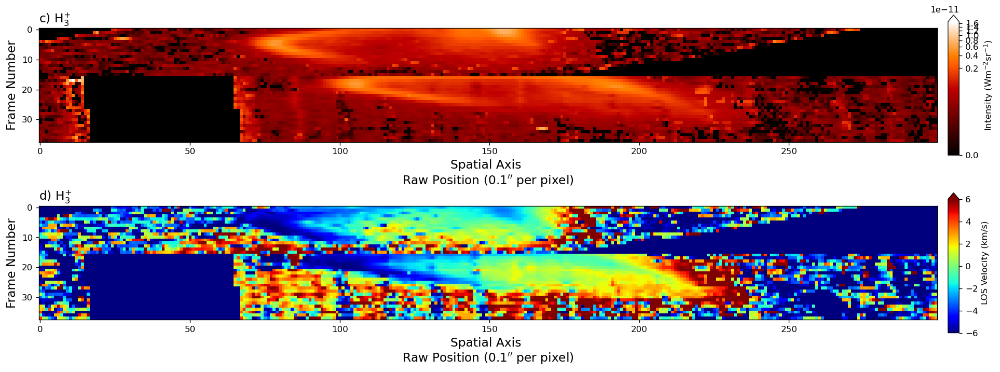

In [46]:
h3pa0 = np.vstack((h3p_a0_map))
h3pa1 = np.vstack((h3p_a1_map)) + 180
h3pa2 = np.vstack((h3p_a2_map))

h3p_fwhm = h3pa2*(np.sqrt(2*np.log(2))*2)
h3p_int = h3pa0*h3p_fwhm/1e11

h3p_wl = h3pa1
h3p_los = h3p_wl/R*3e5

h3p_int1 = np.roll(h3p_int[:6], 26, axis=1)
h3p_int2 = np.roll(h3p_int[6:11], 25, axis=1)
h3p_int3 = np.roll(h3p_int[11:16], 32, axis=1)
h3p_int4 = np.roll(h3p_int[16:27], -15, axis=1)
h3p_int5 = np.roll(h3p_int[27:], -17, axis=1)
h3p_int_shifted = np.vstack((h3p_int1, h3p_int2, h3p_int3, h3p_int4, h3p_int5))

for i in range(16):
    h3p_int_shifted[i,:] = scipy.ndimage.shift(h3p_int_shifted[i,:], i*6, order=3)
    
h3p_los1 = np.roll(h3p_los[:6], 26, axis=1)
h3p_los2 = np.roll(h3p_los[6:11], 25, axis=1)
h3p_los3 = np.roll(h3p_los[11:16], 32, axis=1)
h3p_los4 = np.roll(h3p_los[16:27], -15, axis=1)
h3p_los5 = np.roll(h3p_los[27:], -17, axis=1)
h3p_los_shifted = np.vstack((h3p_los1, h3p_los2, h3p_los3, h3p_los4, h3p_los5))

for i in range(16):
    h3p_los_shifted[i,:] = scipy.ndimage.shift(h3p_los_shifted[i,:], i*6, order=3)
    
    
h3p_int_shifted = np.flip(h3p_int_shifted, axis=1)
h3p_int_shifted[h3p_int_shifted<0]=0
h3p_los_shifted = np.flip(h3p_los_shifted, axis=1)

h3p_los_rel = h3p_los_shifted-np.median(h3p_los_shifted, axis=0)[149]
h3p_los_rel[h3p_los_rel>6] = 6
h3p_los_rel[h3p_los_rel<-6] = -6

fig = plt.figure(figsize=(18,6), tight_layout=True)

# plt.figure(figsize=(15,2))
fig.add_subplot(211)
plt.imshow(h3p_int_shifted, cmap='gist_heat', norm=colors.PowerNorm(gamma=0.2))
plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
plt.ylabel('Frame Number', fontsize=14)
# plt.title(r'a) H$_2$($\lambda$$\approx$' + str(round(waverange[96], 4)) + '$\mu$m)', loc='left')
plt.title('c) H$_3^{+}$', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=12, pad=0.01, label='Intensity (Wm$^{-2}$sr$^{-1}$)')

fig.add_subplot(212)
plt.imshow(h3p_los_rel, cmap='jet')
plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
plt.ylabel('Frame Number', fontsize=14)
# plt.title(r'b) H$_2$($\lambda$$\approx$' + str(round(waverange[96], 4)) + '$\mu$m)', loc='left')
plt.title('d) H$_3^{+}$', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=12, pad=0.01, label='LOS Velocity (km/s)')

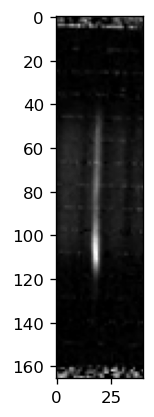

In [111]:
e = np.delete(Fjc, np.s_[970:], 1)
f = np.delete(e, np.s_[:930], 1)

plt.figure()
plt.imshow(f, aspect='equal', cmap='gist_gray')

In [47]:
# define normalization function
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# define guassian function, credit to pen and pants IDL's Gaussfit in Python
def gaussian_fit(x, a0, a1, a2, a3, a4, a5): 
    """
    x = data array
    a0 = height of guassian
    a1 = pixel position of Gaussian peak
    a2 = width of Gaussian
    a3 = constant term
    a4 = linear term
    a5 = quadratic term
    
    note: fwhm = a2 * np.sqrt(2 * np.log(2)) * 2
    """
    z = (x - a1) / a2
    y = a0 * np.exp(-z**2 / a2) + a3 + a4 * x + a5 * x**2
    return y

# confirm start and end frame number
fn_start = 60
fn_end = 104
sky_frame = (51, 59, 60, 72, 78, 79, 91, 103)

# create empty list to collect result
h202_a0_map = []
h202_a1_map = []
h202_a2_map = []


print('H2 LOOP START')
# scan selected range of frames
for fn in range(fn_start, fn_end):
    # check if selected frame is a sky frame
    if fn in sky_frame:
        print('Frame Number = ' + str(fn) + '(Sky Frame)')
        continue
    # perform sky subtraction
    skyfinal = scale_sky_frame(fn)
    sky_subtract = (nirspec_data_array[fn-start_nirspec] - skyfinal) / (average_flat_field - average_flat_lamp_off)
    fjc = sky_subtract * Fc * slit_area
    
    # select waverange for gaussian fit
    a = np.delete(fjc, np.s_[970:], 1)
    b = np.delete(a, np.s_[:930], 1)
    b[b<0] = 0
    
    # define new wavlength axis
#     waveaxis = waverange[80:120]*100000
    pixel = np.linspace(0, np.size(b, 1), np.size(b, 1))
    
    # partition frame numbers to account for change in spatial axis       
    if fn >= fn_start and fn < fn_end:
        print('Frame Number = ' + str(fn))
        
        # define range on spatial axis to fit
        upper_h202 = 250
        lower_h202 = 0

        h202_a0 = np.zeros(300)
        h202_a1 = np.zeros(300)
        h202_a2 = np.zeros(300)
            
        # fit gaussian to selected range of spatial axis of a frame
        for i in range(lower_h202, upper_h202):               
            # different initial guess for different spatial range
            if i >= lower_h202 and i < upper_h202:
            # create lmfit model with defined gaussian
                h202_model = Model(gaussian_fit)

                # create parameters and add initial guess
                h202_params = h202_model.make_params()
                h202_params.add('a0', value=0.1, min=0, max=0.4)
                h202_params.add('a1', value=17, min=14, max=20)
                h202_params.add('a2', value=1, min=0, max=4)
                h202_params.add('a3', value=0)
                h202_params.add('a4', value=0)
                h202_params.add('a5', value=0)
                
                # perform gaussian fit and test errors
                try:
                    h202_fit_result = h202_model.fit(b[i]*1e11, h202_params, x=pixel)
                except ValueError:
                    print('ValueError occured at i=' + str(i))
#                     plt.figure()
#                     plt.title('i='+str(i))
#                     plt.plot(pixel, b[i])
#                     plt.plot(pixel, h202_fit_result.best_fit, 'r-', label='best fit')
                
                # collect fitting parameters
                h202_a0[i] = h202_fit_result.params['a0'].value
                h202_a1[i] = h202_fit_result.params['a1'].value
                h202_a2[i] = h202_fit_result.params['a2'].value
    
    # Collect fitting parameters of each frame number   
    h202_a0_map.append(h202_a0)
    h202_a1_map.append(h202_a1)
    h202_a2_map.append(h202_a2)
    
print('DONE')

H2 LOOP START
Frame Number = 60(Sky Frame)
Frame Number = 61
Frame Number = 62
Frame Number = 63
Frame Number = 64
Frame Number = 65
Frame Number = 66
Frame Number = 67
Frame Number = 68
Frame Number = 69
Frame Number = 70
Frame Number = 71
Frame Number = 72(Sky Frame)
Frame Number = 73
Frame Number = 74
Frame Number = 75
Frame Number = 76
Frame Number = 77
Frame Number = 78(Sky Frame)
Frame Number = 79(Sky Frame)
Frame Number = 80
Frame Number = 81
Frame Number = 82
Frame Number = 83
Frame Number = 84
Frame Number = 85
Frame Number = 86
Frame Number = 87
Frame Number = 88
Frame Number = 89
Frame Number = 90
Frame Number = 91(Sky Frame)
Frame Number = 92
Frame Number = 93
Frame Number = 94
Frame Number = 95
Frame Number = 96
Frame Number = 97
Frame Number = 98
Frame Number = 99
Frame Number = 100
Frame Number = 101
Frame Number = 102
Frame Number = 103(Sky Frame)
DONE


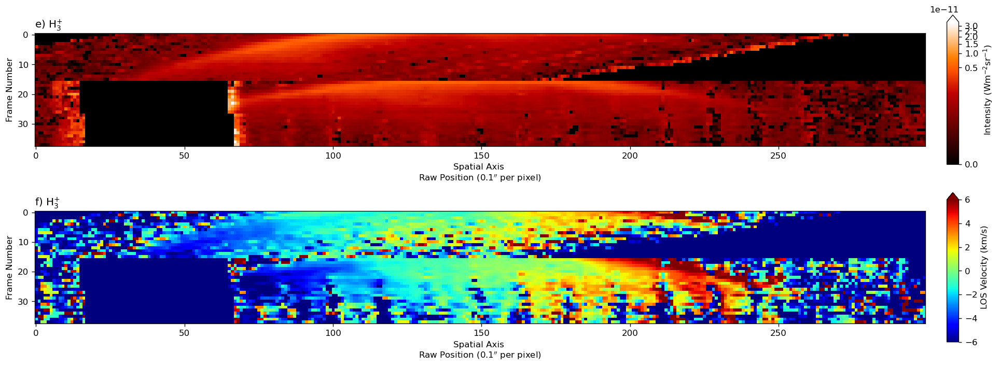

In [48]:
h202a0 = np.vstack((h202_a0_map))
h202a1 = np.vstack((h202_a1_map)) + 930
h202a2 = np.vstack((h202_a2_map))

h202_fwhm = h202a2*(np.sqrt(2*np.log(2))*2)
h202_int = h202a0*h202_fwhm/1e11

h202_wl = h202a1
h202_los = h202_wl/R*3e5

h202_int1 = np.roll(h202_int[:6], 26, axis=1)
h202_int2 = np.roll(h202_int[6:11], 25, axis=1)
h202_int3 = np.roll(h202_int[11:16], 32, axis=1)
h202_int4 = np.roll(h202_int[16:27], -15, axis=1)
h202_int5 = np.roll(h202_int[27:], -17, axis=1)
h202_int_shifted = np.vstack((h202_int1, h202_int2, h202_int3, h202_int4, h202_int5))

for i in range(16):
    h202_int_shifted[i,:] = scipy.ndimage.shift(h202_int_shifted[i,:], i*6, order=3)
    
h202_los1 = np.roll(h202_los[:6], 26, axis=1)
h202_los2 = np.roll(h202_los[6:11], 25, axis=1)
h202_los3 = np.roll(h202_los[11:16], 32, axis=1)
h202_los4 = np.roll(h202_los[16:27], -15, axis=1)
h202_los5 = np.roll(h202_los[27:], -17, axis=1)
h202_los_shifted = np.vstack((h202_los1, h202_los2, h202_los3, h202_los4, h202_los5))

for i in range(16):
    h202_los_shifted[i,:] = scipy.ndimage.shift(h202_los_shifted[i,:], i*6, order=3)
    
    
h202_int_shifted = np.flip(h202_int_shifted, axis=1)
h202_int_shifted[h202_int_shifted<0]=0
h202_los_shifted = np.flip(h202_los_shifted, axis=1)

h202_los_rel = h202_los_shifted-np.median(h202_los_shifted, axis=0)[149]
h202_los_rel[h202_los_rel>6] = 6
h202_los_rel[h202_los_rel<-6] = -6

fig = plt.figure(figsize=(18,6), tight_layout=True)

# plt.figure(figsize=(15,2))
fig.add_subplot(211)
plt.imshow(h202_int_shifted, cmap='gist_heat', norm=colors.PowerNorm(gamma=0.2))
plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)')
plt.ylabel('Frame Number')
# plt.title(r'a) H$_2$($\lambda$$\approx$' + str(round(waverange[96], 4)) + '$\mu$m)', loc='left')
plt.title('e) H$_3^{+}$', loc='left')
plt.colorbar(extend='max', aspect=12, pad=0.02, label='Intensity (Wm$^{-2}$sr$^{-1}$)')

fig.add_subplot(212)
plt.imshow(h202_los_rel, cmap='jet')
plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)')
plt.ylabel('Frame Number')
# plt.title(r'b) H$_2$($\lambda$$\approx$' + str(round(waverange[96], 4)) + '$\mu$m)', loc='left')
plt.title('f) H$_3^{+}$', loc='left')
plt.colorbar(extend='max', aspect=12, pad=0.02, label='LOS Velocity (km/s)')

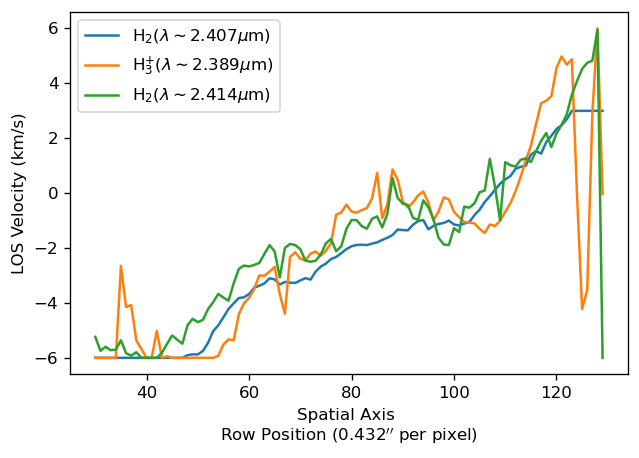

In [121]:
x = np.linspace(0,199,200)

u = 30
v = 130

plt.figure()
plt.plot(x[u:v], h2_los_rel[20][u:v], label=r'H$_2$($\lambda$$\sim$' + str(round(waverange[738],3)) + '$\mu$m)')
plt.plot(x[u:v], h3p_los_rel[20][u:v], label=r'H$_3^{+}$($\lambda$$\sim$' + str(round(waverange[195],3)) + '$\mu$m)')
plt.plot(x[u:v], h202_los_rel[20][u:v], label=r'H$_2$($\lambda$$\sim$' + str(round(waverange[947], 3)) + '$\mu$m)')
plt.xlabel('Spatial Axis \nRow Position (0.432$^{\prime\prime}$ per pixel)')
plt.ylabel('LOS Velocity (km/s)')
plt.legend()

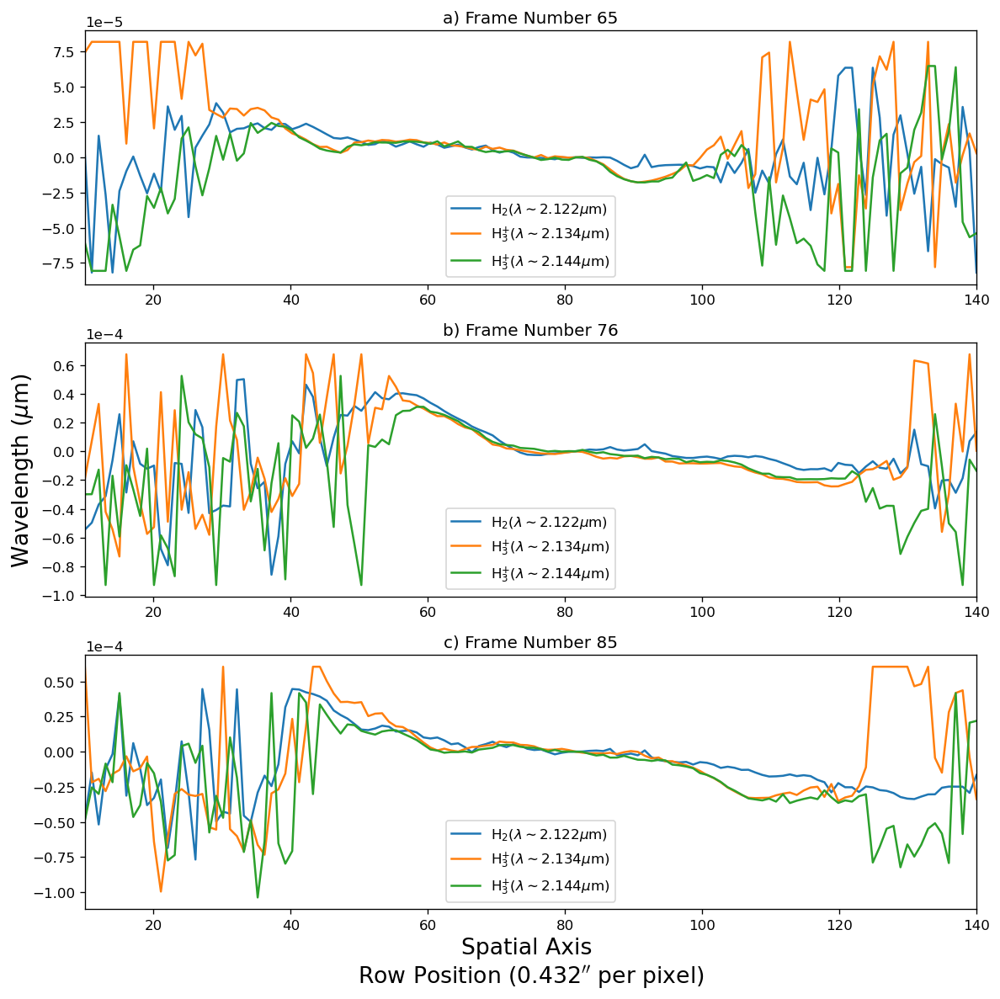

In [211]:
x = np.linspace(10,140,130)

t1 = 5
t2 = 17
t3 = 22
u = 0
v = 130

fig = plt.figure(figsize=(10,10), tight_layout=True)

fig.add_subplot(311)
plt.plot(x[u:v], h2_wl[t1][u:v] - h2_wl[t1][71], label=r'H$_2$($\lambda$$\sim$' + str(round(waverange[80], 3)) + '$\mu$m)')
plt.plot(x[u:v], h3p01_wl[t1][u:v] - h3p01_wl[t1][71], label=r'H$_3^{+}$($\lambda$$\sim$' + str(round(waverange[500], 3)) + '$\mu$m)')
plt.plot(x[u:v], h3p02_wl[t1][u:v] - h3p02_wl[t1][71], label=r'H$_3^{+}$($\lambda$$\sim$' + str(round(waverange[842], 3)) + '$\mu$m)')
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
# plt.xlabel('Spatial Axis \nRow Position (0.432$^{\prime\prime}$ per pixel)')
# plt.ylabel('Wavelength ($\mu$m)')
plt.title('a) Frame Number ' + str(65))
plt.xlim(10,140)
plt.legend()

fig.add_subplot(312)
plt.plot(x[u:v], h2_wl[t2][u:v] - h2_wl[t2][71], label=r'H$_2$($\lambda$$\sim$' + str(round(waverange[80], 3)) + '$\mu$m)')
plt.plot(x[u:v], h3p01_wl[t2][u:v] - h3p01_wl[t2][71], label=r'H$_3^{+}$($\lambda$$\sim$' + str(round(waverange[500], 3)) + '$\mu$m)')
plt.plot(x[u:v], h3p02_wl[t2][u:v] - h3p02_wl[t2][71], label=r'H$_3^{+}$($\lambda$$\sim$' + str(round(waverange[842], 3)) + '$\mu$m)')
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
# plt.xlabel('Spatial Axis \nRow Position (0.432$^{\prime\prime}$ per pixel)')
plt.ylabel('Wavelength ($\mu$m)', fontsize=16)
plt.title('b) Frame Number ' + str(76))
plt.xlim(10,140)
plt.legend()

fig.add_subplot(313)
plt.plot(x[u:v], h2_wl[t3][u:v] - h2_wl[t3][71], label=r'H$_2$($\lambda$$\sim$' + str(round(waverange[80], 3)) + '$\mu$m)')
plt.plot(x[u:v], h3p01_wl[t3][u:v] - h3p01_wl[t3][71], label=r'H$_3^{+}$($\lambda$$\sim$' + str(round(waverange[500], 3)) + '$\mu$m)')
plt.plot(x[u:v], h3p02_wl[t3][u:v] - h3p02_wl[t3][71], label=r'H$_3^{+}$($\lambda$$\sim$' + str(round(waverange[842], 3)) + '$\mu$m)')
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.xlabel('Spatial Axis \nRow Position (0.432$^{\prime\prime}$ per pixel)', fontsize=16)
# plt.ylabel('Wavelength ($\mu$m)')
plt.title('c) Frame Number ' + str(85))
plt.xlim(10,140)
plt.legend()